# Air BNB Housing Data from Venice, Italy

One of my favorite, and saddest, parts of the world right now is Venice, Italy. From the city itself sinking every year, inaction on local politicians to save the city, and general breaking down of the culture in the city, it has become an almost macabre joy for me every time I get the chance to visit.

Let's look at the Air BNB data surrounding the city and try to get some interesting EDA and modelling out of it to see how Air BNB's presence in the city plays out.

## Dataset
Data was pulled from this website - http://insideairbnb.com/

Specifically here - http://insideairbnb.com/get-the-data.html


In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import norm

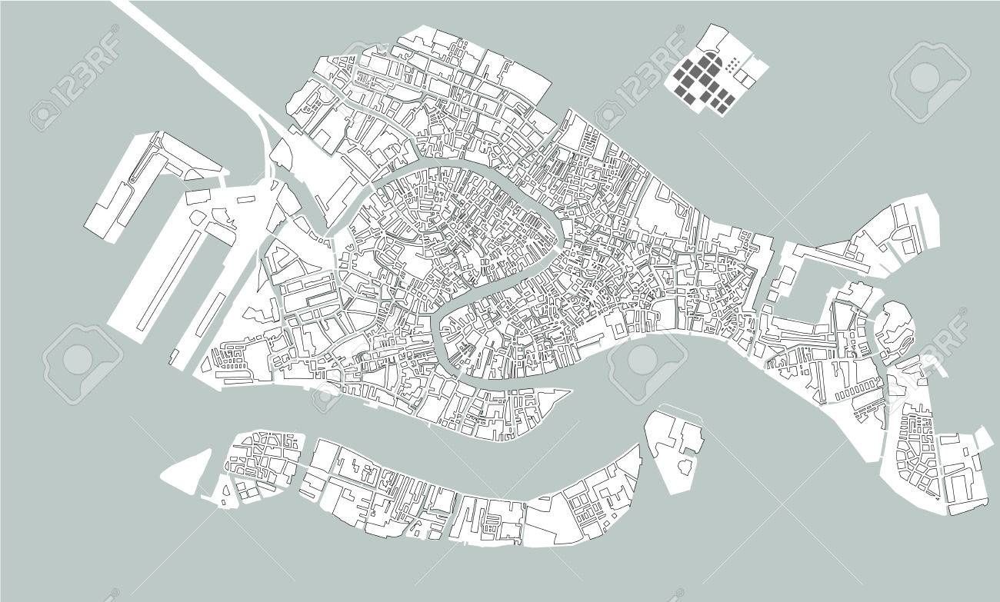

In [2]:
from IPython.display import Image
c_directory = os.getcwd()
#folder = r"\\Day-3"
#data = pd.read_csv(c_directory + folder + r'\\listings.csv')
data = pd.read_csv(c_directory + r'\\listings.csv')
image = Image(c_directory + r'\\venice_vectormap.jpg')
image

In [3]:
### Let's first focus on subsetting the data we actually want to analyze. 
### Since I'm focusing mostly on some EDA and analysis I'll look through the data quick and make some judgments
data.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

In [4]:
data.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,8.372000e+03,8.372000e+03,8.372000e+03,8369.000000,8369.000000,8372.000000,8372.000000,8372.000000,0.0,8164.000000,...,7154.00000,7154.000000,7155.000000,7154.000000,7153.000000,8372.000000,8372.000000,8372.000000,8372.000000,7203.000000
mean,2.262955e+07,2.020101e+13,9.750764e+07,17.658143,17.658143,45.445098,12.319665,3.912207,NaN,1.612200,...,9.55102,9.667319,9.647799,9.774951,9.321543,9.761825,7.703177,1.527473,0.029145,1.704922
std,1.355455e+07,4.375261e-01,1.009971e+08,86.821523,86.821523,0.022871,0.039784,1.957879,NaN,0.864324,...,0.82223,0.751737,0.795083,0.578480,0.823186,19.810213,18.229281,4.954659,0.314673,1.737273
min,6.623000e+03,2.020101e+13,1.501600e+04,0.000000,0.000000,45.278950,12.173900,1.000000,NaN,1.000000,...,2.00000,2.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.010000
25%,1.152440e+07,2.020101e+13,1.235549e+07,1.000000,1.000000,45.434180,12.322910,2.000000,NaN,1.000000,...,9.00000,10.000000,9.000000,10.000000,9.000000,1.000000,1.000000,0.000000,0.000000,0.400000
50%,2.275247e+07,2.020101e+13,5.291768e+07,3.000000,3.000000,45.438340,12.331140,4.000000,NaN,1.000000,...,10.00000,10.000000,10.000000,10.000000,9.000000,3.000000,2.000000,0.000000,0.000000,1.180000
75%,3.401443e+07,2.020101e+13,1.705903e+08,9.000000,9.000000,45.444590,12.339860,5.000000,NaN,2.000000,...,10.00000,10.000000,10.000000,10.000000,10.000000,8.000000,5.000000,1.000000,0.000000,2.435000
max,4.576146e+07,2.020101e+13,3.696481e+08,1256.000000,1256.000000,45.536850,12.421370,16.000000,NaN,14.000000,...,10.00000,10.000000,10.000000,10.000000,10.000000,125.000000,125.000000,42.000000,5.000000,30.080000


In [5]:
data_subset = data[['id',
                    'host_id',
                    'host_name',
                    'neighbourhood_cleansed',
                    'neighbourhood_group_cleansed',
                    'latitude',
                    'longitude',
                    'room_type',
                    'price',
                    'number_of_reviews',
                    'review_scores_cleanliness',
                    'availability_365',
                    'last_review']]

data_subset

,id,host_id,host_name,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,room_type,price,number_of_reviews,review_scores_cleanliness,availability_365,last_review
0,6623,15016,Francesca,San Polo,Isole,45.43823,12.32902,Entire home/apt,$225.00,162,10.0,320,2019-11-06
1,6624,15016,Francesca,San Polo,Isole,45.43845,12.32869,Entire home/apt,$250.00,64,10.0,342,2019-11-03
2,12074,15016,Francesca,San Polo,Isole,45.43827,12.32764,Entire home/apt,$122.00,184,10.0,265,2019-10-07
3,27116,116144,Gianni,San Marco,Isole,45.43221,12.33411,Private room,$159.00,410,10.0,351,2020-02-21
4,44527,120215,Marc & Elisabeth,Cannaregio,Isole,45.44754,12.32918,Entire home/apt,$200.00,72,9.0,356,2020-01-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8367,45719350,42651160,Michele,Castello,Isole,45.43427,12.34479,Entire home/apt,$88.00,0,NaN,266,NaN
8368,45720046,177648040,Marco,Giudecca,Isole,45.42446,12.32543,Entire home/apt,$68.00,0,NaN,174,NaN
8369,45728038,2737672,Federica,San Lorenzo XXV Aprile,Terraferma,45.49488,12.23718,Entire home/apt,$32.00,0,NaN,0,NaN
8370,45751583,362226632,Claudia,Campalto Gobbi,Terraferma,45.49320,12.29324,Private room,$32.00,0,NaN,250,NaN


In [6]:
data_subset.info()

data_subset.isnull().sum()

#### I'm going to remove the null values since I don't think I'll need them
data_subset = data_subset[pd.notnull(data_subset['host_name'])]
data_subset = data_subset[pd.notnull(data_subset['review_scores_cleanliness'])]
data_subset.isnull().sum()

data_subset.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8372 entries, 0 to 8371
Data columns (total 13 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            8372 non-null   int64  
 1   host_id                       8372 non-null   int64  
 2   host_name                     8369 non-null   object 
 3   neighbourhood_cleansed        8372 non-null   object 
 4   neighbourhood_group_cleansed  8372 non-null   object 
 5   latitude                      8372 non-null   float64
 6   longitude                     8372 non-null   float64
 7   room_type                     8372 non-null   object 
 8   price                         8372 non-null   object 
 9   number_of_reviews             8372 non-null   int64  
 10  review_scores_cleanliness     7154 non-null   float64
 11  availability_365              8372 non-null   int64  
 12  last_review                   7203 non-null   object 
dtypes: 

id                                int64
host_id                           int64
host_name                        object
neighbourhood_cleansed           object
neighbourhood_group_cleansed     object
latitude                        float64
longitude                       float64
room_type                        object
price                            object
number_of_reviews                 int64
review_scores_cleanliness       float64
availability_365                  int64
last_review                      object
dtype: object

## Analysis
Now that that's complete. We can go forward and plot and do some quick EDA before time is up

I noticed price was an object and realized that the $ should be taken out and converted to float

In [7]:
#convert price to a numerical value since it was an object
data_subset['price'] = data_subset['price'].str.replace(',', '')
data_subset['price'] = data_subset['price'].str.replace('$', '')
data_subset['price'] = pd.to_numeric(data_subset.price)
data_subset['price']

0       225.0
1       250.0
2       122.0
3       159.0
4       200.0
        ...  
8297     79.0
8306     28.0
8311     12.0
8312    150.0
8315     49.0
Name: price, Length: 7152, dtype: float64

In [8]:
#Function to quickly print the quant. variables in the dataset

def distplot(d):
    cols = []
    
    #Feature thats int or float
    for i in d.columns:
        if d[i].dtypes == "float64" or d[i].dtypes == "int64":
            cols.append(i)

    pl = plt.figure(figsize=(10,10))
    pl.subplots_adjust(wspace=0.5, hspace=0.5)

    for i in range(1, len(cols)+1):
        ax = pl.add_subplot(3,3,i)
        sns.distplot(d[cols[i-1]], fit=norm)
        ax.set_title(format(cols[i-1]))

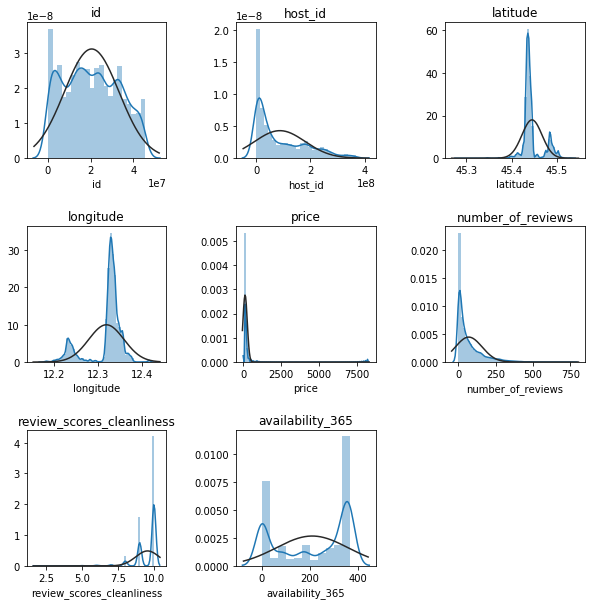

In [9]:
distplot(data_subset)

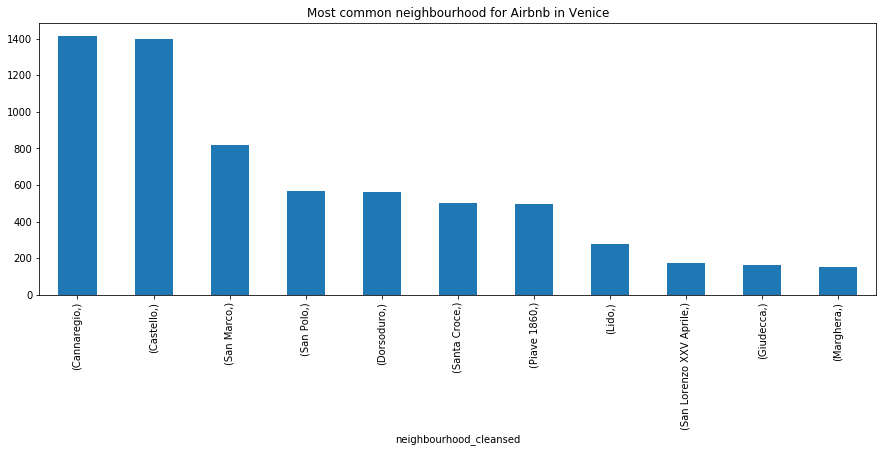

In [10]:
neighborhoods = data_subset[['neighbourhood_cleansed']].value_counts()
neighborhoods[neighborhoods>100].plot(figsize=(15,5), kind='bar')
plt.title('Most common neighbourhood for Airbnb in Venice')
plt.show()

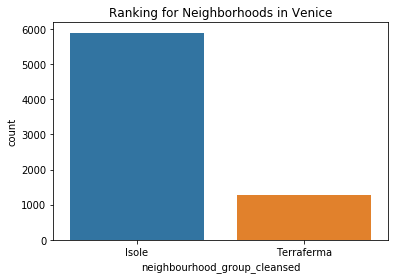

In [11]:
sns.countplot(data_subset['neighbourhood_group_cleansed'])
plt.title('Ranking for Neighborhoods in Venice')
plt.show()

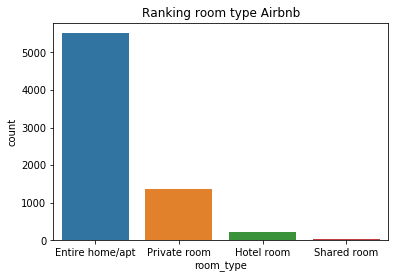

In [12]:
#what about room types?
sns.countplot(data_subset['room_type'])
plt.title('Ranking room type Airbnb')
plt.show()

In [13]:
#Set index for later timeseries
#This is also a simple way to re-set the index too :)

#reused code from yesterday to convert my last row to datetime
data_subset['last_review'] = pd.to_datetime(data_subset[['last_review']].astype(str).sum(axis=1))
#make the index of the data the date now
data_subset = data_subset.set_index('last_review') 

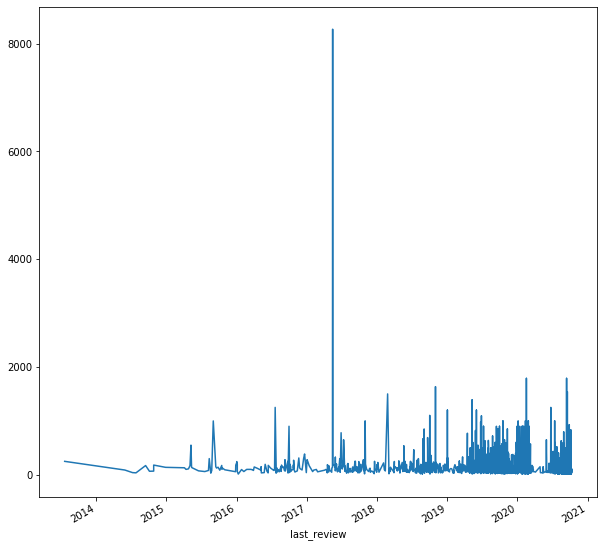

In [14]:
data_subset.price.plot(figsize = (10,10))

Looks like someone paid a pretty exorbidant fee to stay in venice. Let's find that

In [15]:
data_subset.loc[data_subset.price > 5000]

,id,host_id,host_name,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,room_type,price,number_of_reviews,review_scores_cleanliness,availability_365
last_review,,,,,,,,,,,,
2017-05-15,16403015,107462308,Dei Scafati,Marghera,Terraferma,45.47854,12.23161,Shared room,8266.0,2,8.0,221


I'm gonna take that out

In [16]:
data_subset = data_subset[data_subset['price']<2000]

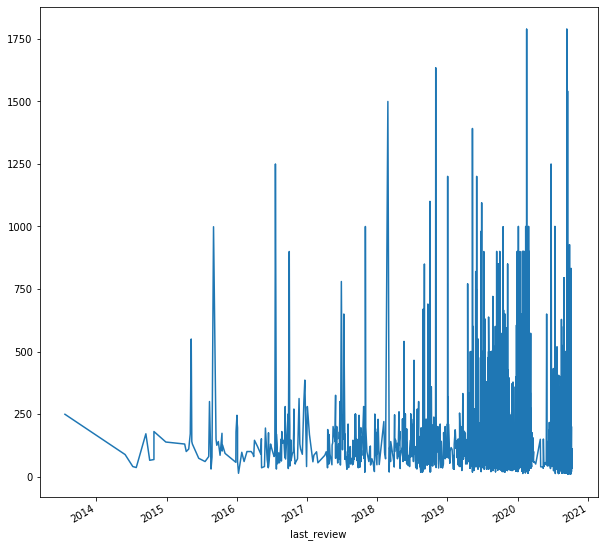

In [17]:
data_subset.price.plot(figsize = (10,10))

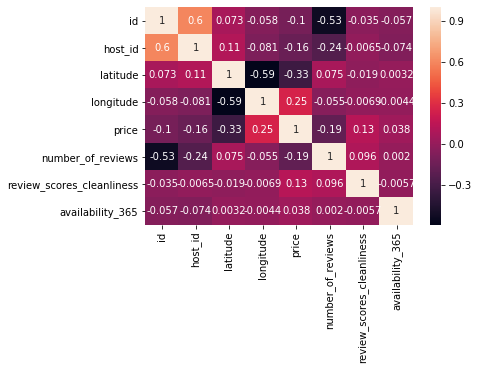

In [18]:
corr = data_subset.corr(method = 'spearman')
sns.heatmap(corr, annot = True)
plt.show()

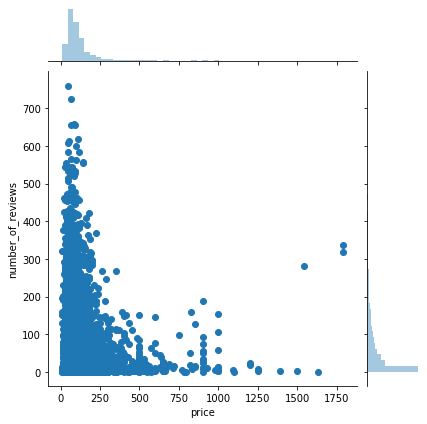

In [19]:
sns.jointplot(x = 'price', y = 'number_of_reviews',data=data_subset)

In [20]:
def corrplot(d):
    cols = []
    
    #Feature thats int or float
    for i in d.columns:
        if d[i].dtypes == "float64" or d[i].dtypes == "int64":
            cols.append(i)

    pl = plt.figure(figsize=(10,10))
    pl.subplots_adjust(wspace=0.5, hspace=0.5)

    for i in range(1, len(cols)+1):
        sns.jointplot(x=d['price'], y=d[cols[i-1]], data=d)

<Figure size 720x720 with 0 Axes>

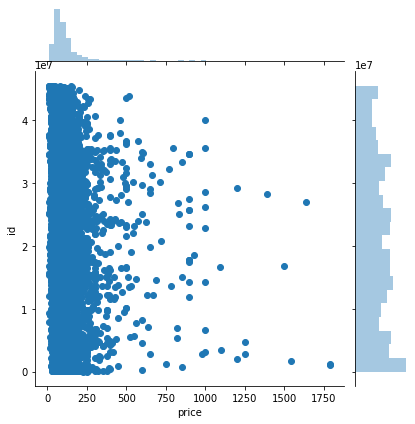

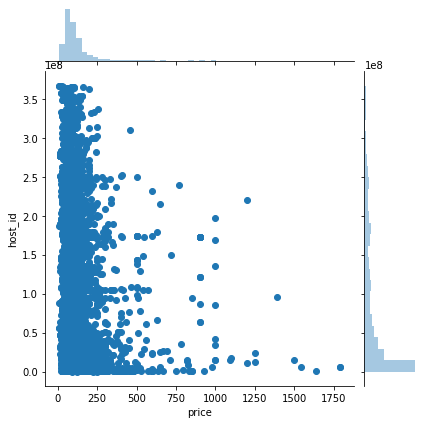

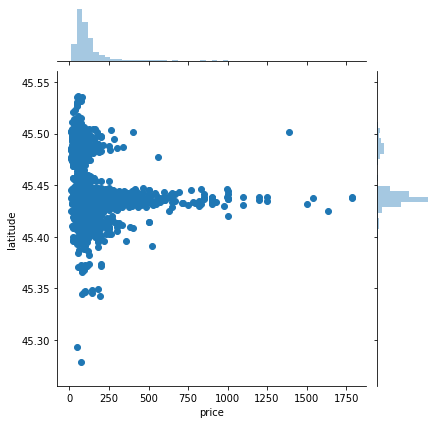

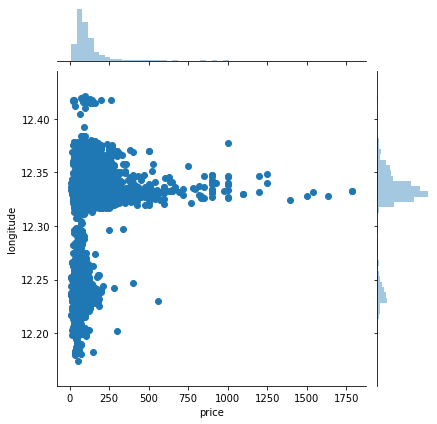

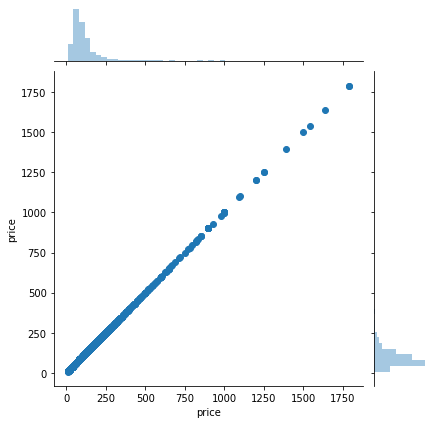

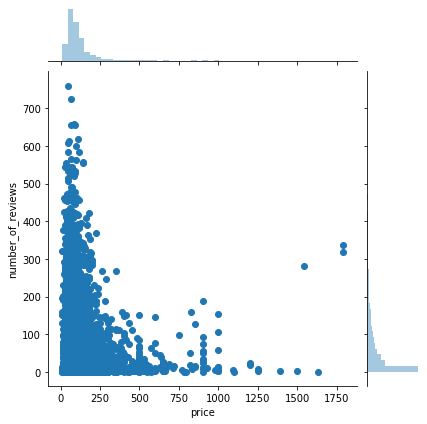

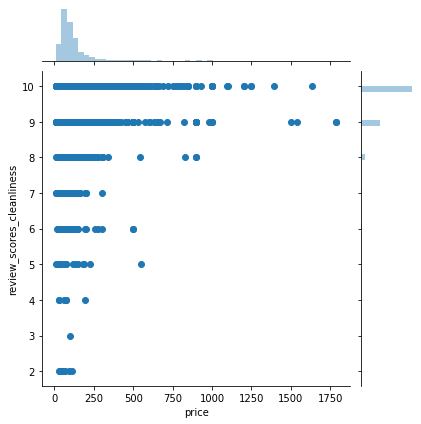

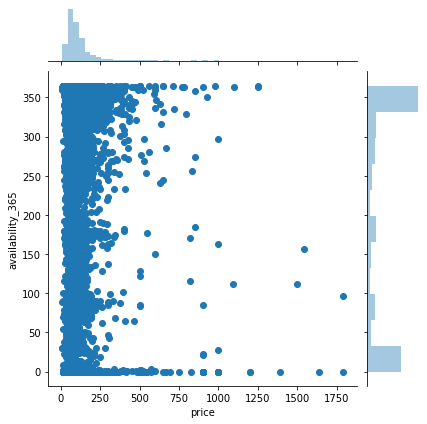

In [21]:
corrplot(data_subset)

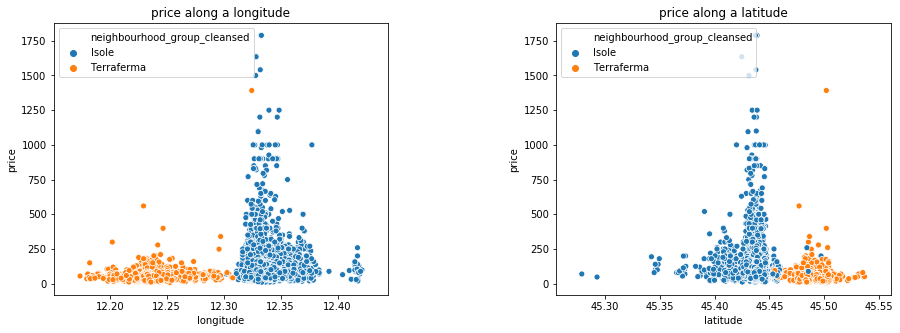

In [22]:
fig=plt.figure(figsize=(15,5))
fig.subplots_adjust(wspace=0.5, hspace=0.5)
a1 = fig.add_subplot(1,2,1)
a2 = fig.add_subplot(1,2,2)

sns.scatterplot(x='longitude', y='price', hue='neighbourhood_group_cleansed', data=data_subset, ax=a1)
sns.scatterplot(x='latitude', y='price', hue='neighbourhood_group_cleansed', data=data_subset, ax=a2)

a1.set_title('price along a longitude')
a2.set_title('price along a latitude')
plt.show()

## Model Price

In [49]:
data_subset.dtypes

id                                 int64
host_id                            int64
host_name                         object
neighbourhood_cleansed          category
neighbourhood_group_cleansed    category
latitude                         float64
longitude                        float64
room_type                       category
price                            float64
number_of_reviews                  int64
review_scores_cleanliness        float64
availability_365                   int64
dtype: object

In [79]:
data_subset['neighbourhood_cleansed'] = data_subset['neighbourhood_cleansed'].astype('category')
data_subset['neighbourhood_group_cleansed'] = data_subset['neighbourhood_group_cleansed'].astype('category')
data_subset['room_type'] = data_subset['room_type'].astype('category')

In [80]:
Y = data_subset['price']
X = data_subset.drop(['price'], axis='columns', inplace=False)
X = X.drop(['host_name'], axis='columns', inplace=False)
X = X.drop(['id'], axis='columns', inplace=False)
X = X.drop(['host_id'], axis='columns', inplace=False)
X = X.drop(['neighbourhood_cleansed'], axis='columns', inplace=False)
X = X.drop(['neighbourhood_group_cleansed'], axis='columns', inplace=False)
X = X.drop(['room_type'], axis='columns', inplace=False)

In [81]:
X.head()

,latitude,longitude,number_of_reviews,review_scores_cleanliness,availability_365
last_review,,,,,
2019-11-06,45.43823,12.32902,162,10.0,320
2019-11-03,45.43845,12.32869,64,10.0,342
2019-10-07,45.43827,12.32764,184,10.0,265
2020-02-21,45.43221,12.33411,410,10.0,351
2020-01-04,45.44754,12.32918,72,9.0,356


In [82]:
from sklearn import linear_model

In [83]:
X = X.apply(pd.to_numeric, errors='coerce')
Y = Y.apply(pd.to_numeric, errors='coerce')
X.fillna(0, inplace=True)
Y.fillna(0, inplace=True)
regr = linear_model.LinearRegression()
regr.fit(X, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

Predict if long and lat were 45,12. Review = 100, 6 cleanliness and 200 availability

In [89]:
predicted = regr.predict([[45,12,100,6,200]])
predicted


array([298.71083197])

In [90]:
regr.coef_

array([-6.49304200e+02,  2.21919321e+02, -1.39066935e-01,  7.59595256e+00,
       -6.10056127e-03])